# Lane Lines Detection
This notebook demonstrates a computer vision approach to detecting lane lines in road images, a crucial component in autonomous driving systems. We'll walk through the process step-by-step, from image preprocessing to the final lane line detection.



## 1. Importing Libraries and Loading the Image
We'll start by importing the necessary libraries and loading a sample image from a video.

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

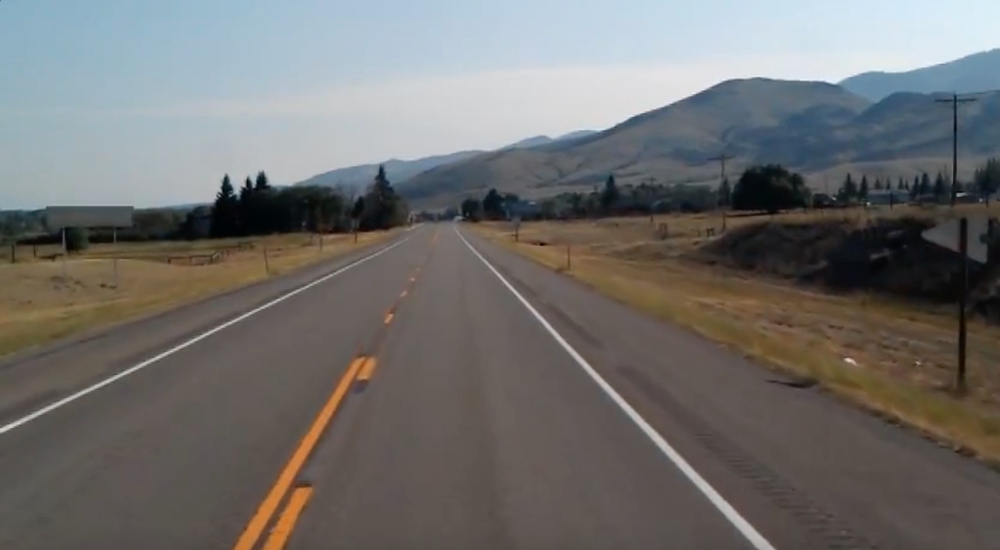

In [ ]:
# Load an image from the video to perform lane detection
image = cv2.imread('/content/drive/MyDrive/CV Self Driving Car/Finding-Lanes/test_image.jpg')
cv2_imshow(image)

# Note: This image will serve as our test case throughout the notebook

## 2. Image Preprocessing
Before we can detect lane lines, we need to preprocess the image to highlight the features we're interested in.

### 2.1. Grayscale Conversion
We convert the image to grayscale to simplify our analysis. Lane lines are often white or yellow, which have high contrast in grayscale.

In [ ]:
import numpy as np

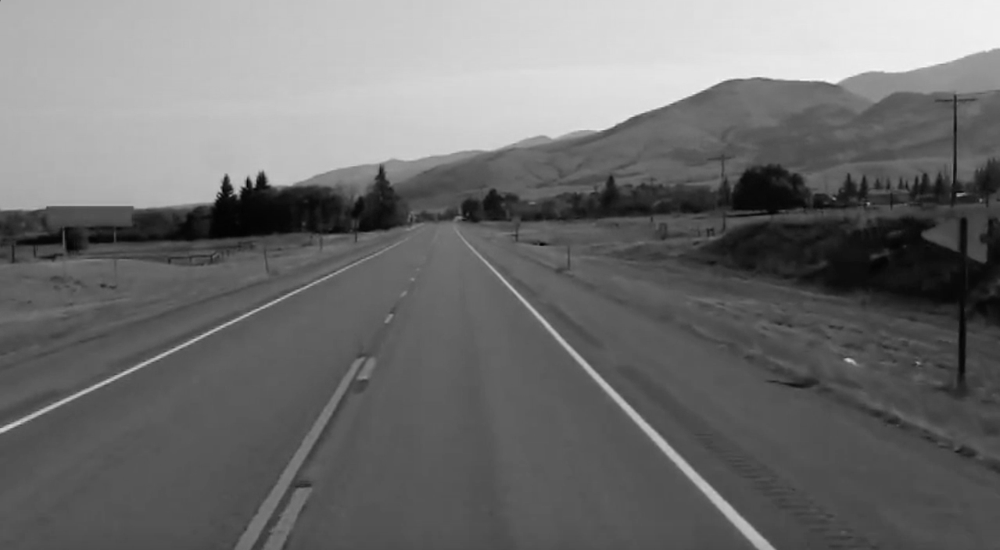

In [ ]:
lane_image = np.copy(image)   # To avoid changes in the original image
gray = cv2.cvtColor(lane_image, cv2.COLOR_RGB2GRAY)
cv2_imshow(gray)

### 2.2. Noise Reduction
We apply Gaussian blur to reduce noise and smooth out the image. This helps in more accurate edge detection in the next step.

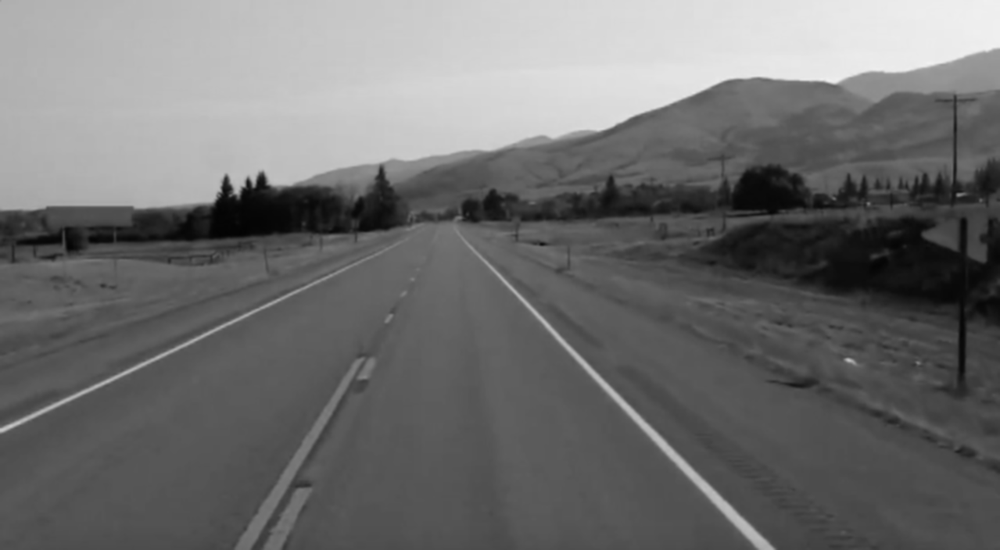

In [ ]:
blur = cv2.GaussianBlur(gray, (5, 5), 0)  # To reduce noise in the grayscale image
cv2_imshow(blur)

## 3. Edge Detection
We use the Canny edge detection algorithm to identify sharp changes in intensity in the image. These edges are likely to include our lane lines.

The Canny function uses two thresholds:

* Low threshold: Weak edges below this value are rejected.
* High threshold: Strong edges above this value are accepted.
* Edges between the thresholds are accepted if they're connected to strong edges.

Adjusting these thresholds can fine-tune our lane detection.

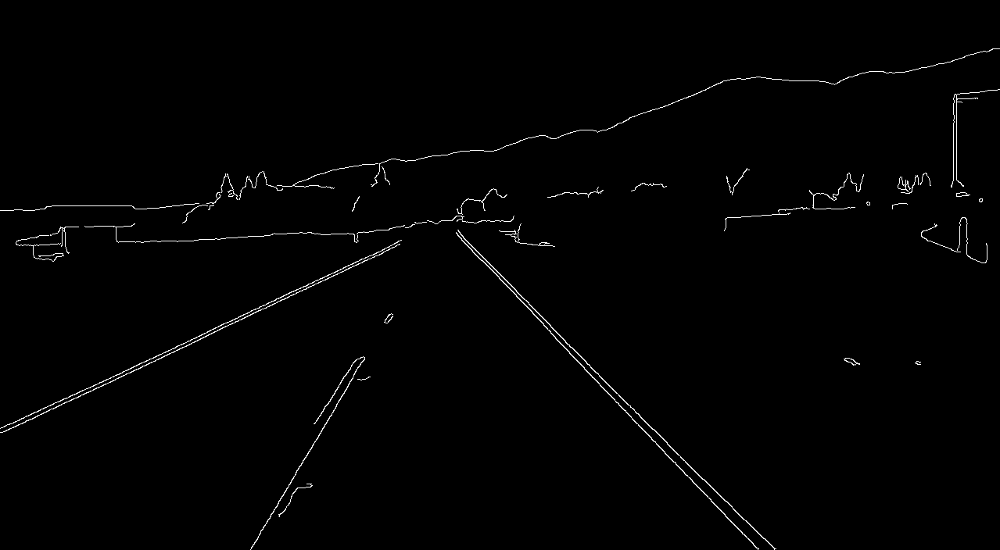

In [ ]:
canny = cv2.Canny(blur, 50, 150)
cv2_imshow(canny)

In [ ]:
# Plotting this Canny Image with the help of Matplotlib
import matplotlib.pyplot as plt

def canny(image):
  gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  blur = cv2.GaussianBlur(gray, (5, 5), 0)
  canny = cv2.Canny(blur, 50, 150)
  return canny

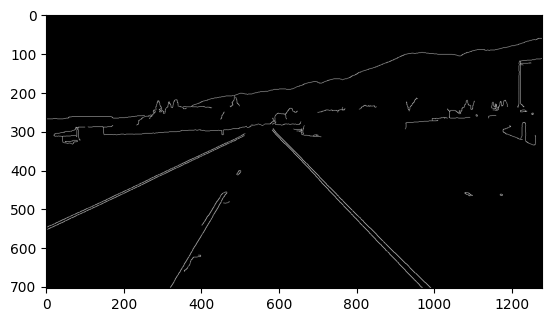

In [ ]:
canny = canny(lane_image)
plt.imshow(canny, cmap='gray')
plt.show()

## 4. Region of Interest
To focus our analysis on the relevant part of the image, we define a region of interest. This is typically a trapezoidal area where we expect to find lane lines. Everything outside this area is masked out.

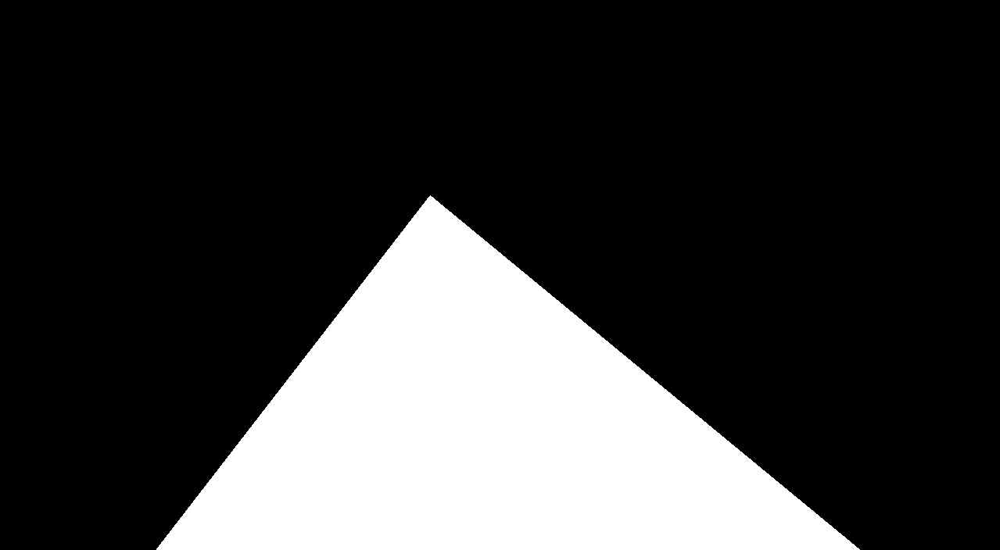

In [ ]:
def region_of_interest(image):
  height = image.shape[0]   # It's a 2-d array, first value corresponds to number of rows which is nothing but a height

  # The polygon coordinates define a triangular region of interest that masks out irrelevant parts of the image
  polygons = np.array([
      [(200, height), (1100, height), (550, 250)]
  ])

  mask = np.zeros_like(image) # Creates an array of 0's with the same shape as the image's corresponding array
  # All of the pixels will be completely black as they'll 0 intensity

  # Fill this mask with the polygon
  cv2.fillPoly(mask, polygons, 255)
  return mask

cv2_imshow(region_of_interest(canny))

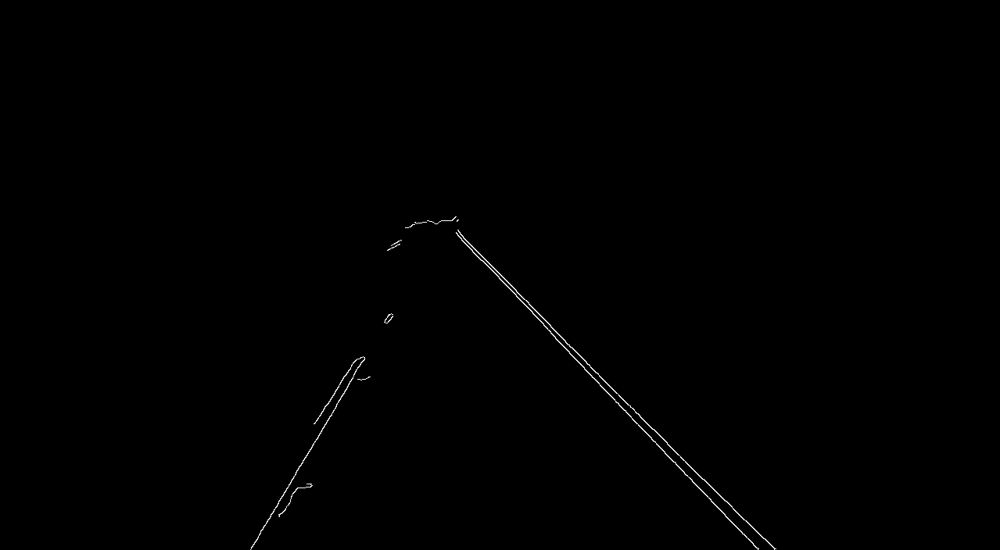

In [ ]:
def region_of_interest(image):
  height = image.shape[0]
  polygons = np.array([
      [(200, height), (1100, height), (550, 250)]
  ])
  mask = np.zeros_like(image)

  cv2.fillPoly(mask, polygons, 255)
  masked_image = cv2.bitwise_and(image, mask)
  return masked_image

cropped_image = region_of_interest(canny)
cv2_imshow(cropped_image)

## 5. Hough Space

- The Hough Transform is used to detect straight lines in our edge-detected image. It works by transforming our image points into Hough space, where straight lines can be easily identified.

Key parameters:

    - rho(ρ)       : Distance resolution of the accumulator in pixels.
    - theta(θ)     : Angle resolution of the accumulator in radians.
    - threshold    : Minimum number of intersections to detect a line.
    - minLineLength: Minimum length of a line.
    - maxLineGap.  : Maximum allowed gap between line segments to treat them as a single line.
Adjusting these parameters allows us to fine-tune our line detection.
- The smaller the ρ and degree intervals we specify for each bin, the smaller the bins and the more precision in which we can detect our lines.
- Too small bins can result in inaccuracies.


## 6. Line Drawing & Blending
After detecting the lines using the Hough Transform, we need to visualize them on our original image. This involves two main steps:

Drawing the detected lines on a blank image.
Blending the line image with the original image to create our final output.

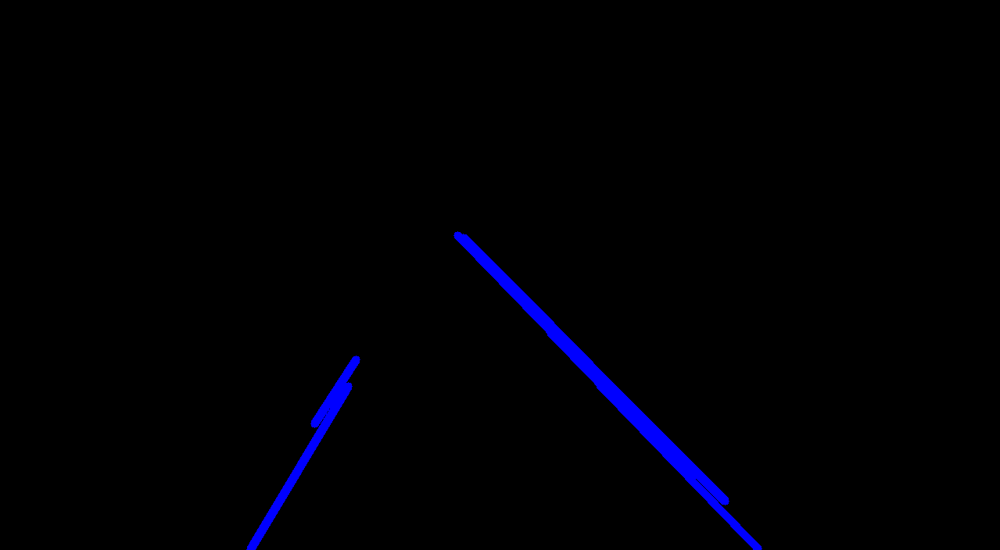

In [ ]:
def display_lines(image, lines):
  line_image = np.zeros_like(image)
  if lines is not None:
    for line in lines:
      x1, y1, x2, y2 = line.reshape(4)
      cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), thickness=10) # Draws a line segment connecting two points
  return line_image

# Detect lines using Hough Transform
lines = cv2.HoughLinesP(cropped_image, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)

# Draw lines on a blank image
line_image = display_lines(lane_image, lines)
cv2_imshow(line_image)

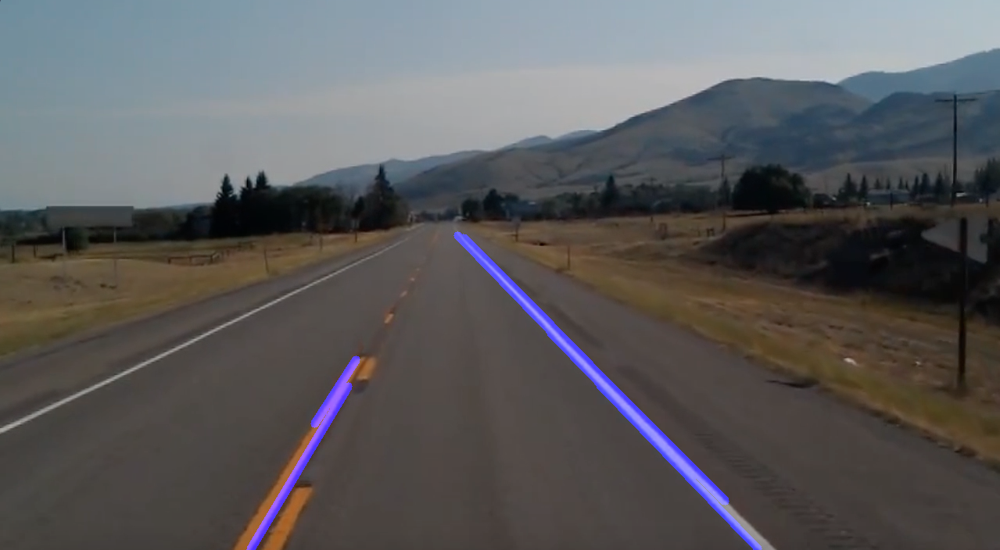

In [ ]:
def display_lines(image, lines):
  line_image = np.zeros_like(image)
  if lines is not None:
    for line in lines:
      x1, y1, x2, y2 = line.reshape(4)
      cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), thickness=10) # draws a line segment connecting two points
  return line_image

lines = cv2.HoughLinesP(cropped_image, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)
line_image = display_lines(lane_image, lines)

# Blend the line image with the original image
# line_image is given 80% weight, while the original image is given 100% weight
# multiply all lane_image elemnets by 0.8 and multiply line_image elements by 1
# line image will have 20% more weight, means lines will be clearly defined when we blend two images
combo_image = cv2.addWeighted(lane_image, 0.8, line_image, 1, 1)
cv2_imshow(combo_image)

## 7. Line Averging & Extrapolation
To improve the lane detection, we can average and extrapolate the multiple detected lines into a single line for each lane. This process involves:

1. Separating left and right lane lines based on their slope.
2. Averaging the slope and y-intercept of the lines for each lane.
3. Extrapolating these average lines to cover the full height of our region of interest.

This approach results in more stable and consistent lane lines, especially when dealing with dashed lines or imperfections in the road markings.

Lane Lines with Averaging:


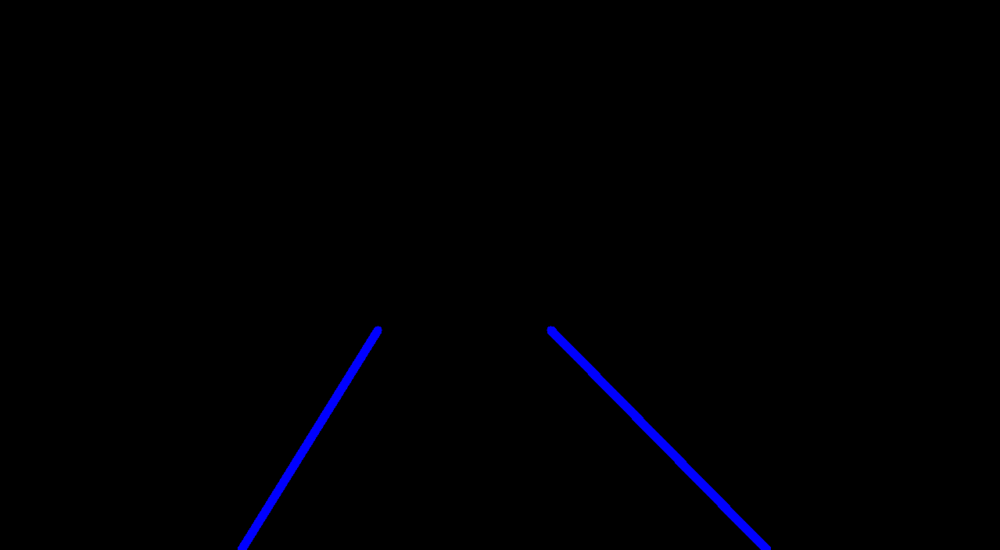


Lines Displayed on the Image:


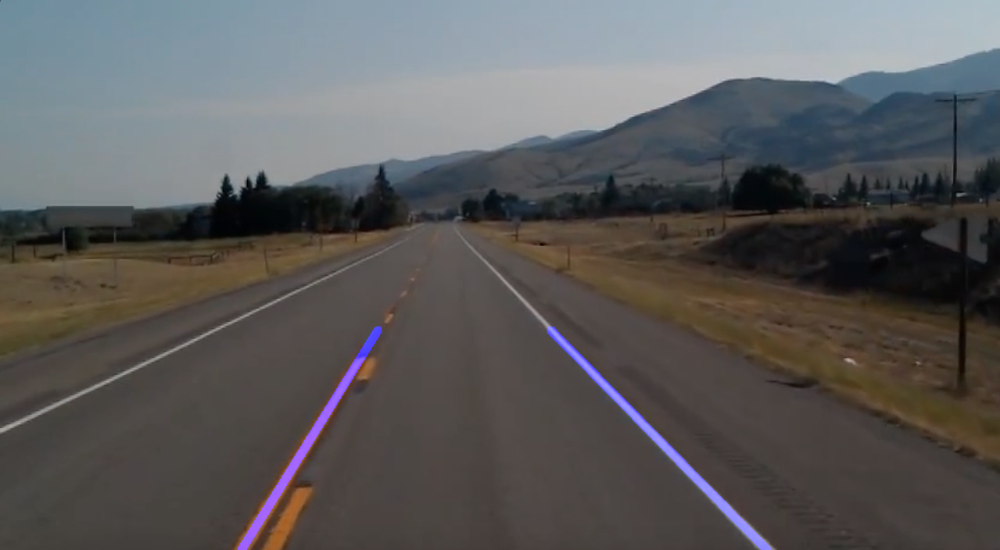

In [18]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

def canny(image):
  gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  blur = cv2.GaussianBlur(gray, (5, 5), 0)
  canny = cv2.Canny(blur, 50, 150)
  return canny

def display_lines(image, lines):
  line_image = np.zeros_like(image)
  if lines is not None:
    for x1, y1, x2, y2 in lines:
      cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), thickness=10)
  return line_image

def region_of_interest(image):
  height = image.shape[0]
  polygons = np.array([
      [(200, height), (1100, height), (550, 250)]
  ])
  mask = np.zeros_like(image)
  cv2.fillPoly(mask, polygons, 255)
  masked_image = cv2.bitwise_and(image, mask)
  return masked_image

def make_coordinates(image, line_parameters):
  slope, intercept = line_parameters
  y1 = image.shape[0] # Bottom of the image
  y2 = int(y1 * (3/5)) # Slightly above the middle
  x1 = int((y1 - intercept)/slope)
  x2 = int((y2 - intercept)/slope)
  return np.array([x1, y1, x2, y2])

def average_slope_intercept(image, lines):
    left_fit = []
    right_fit = []
    for line in lines:
        x1, y1, x2, y2 = line.reshape(4)
        parameters = np.polyfit((x1, x2), (y1, y2), 1)
        slope = parameters[0]
        intercept = parameters[1]
        if slope < 0: # Negative slope for left lane
            left_fit.append((slope, intercept))
        else: # Positive slope for right lane
            right_fit.append((slope, intercept))

    # Average all the values into a single slope and intercept
    left_fit_average = np.average(left_fit, axis=0)
    right_fit_average = np.average(right_fit, axis=0)

    # Generate line coordinates
    left_line = make_coordinates(image, left_fit_average)
    right_line = make_coordinates(image, right_fit_average)
    return np.array([left_line, right_line])


image = cv2.imread('/content/drive/MyDrive/CV Self Driving Car/Finding-Lanes/test_image.jpg')
lane_image = np.copy(image)
canny_image = canny(lane_image)
cropped_image = region_of_interest(canny_image)
lines = cv2.HoughLinesP(cropped_image, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)

# Use the new functions to get averaged lines
averaged_lines = average_slope_intercept(lane_image, lines)
line_image = display_lines(lane_image, averaged_lines)
combo_image = cv2.addWeighted(lane_image, 0.8, line_image, 1, 1)

print("Lane Lines with Averaging:")
cv2_imshow(line_image)
print("\nLines Displayed on the Image:")
cv2_imshow(combo_image)

## 8. Capturing Lane Lines In the Video With The Final Code

In [17]:
from IPython.display import Video, display
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

def canny(image):
  gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  blur = cv2.GaussianBlur(gray, (5, 5), 0)
  canny = cv2.Canny(blur, 50, 150)
  return canny

def display_lines(image, lines):
  line_image = np.zeros_like(image)
  if lines is not None:
    for x1, y1, x2, y2 in lines:
      cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), thickness=10)
  return line_image

def region_of_interest(image):
  height = image.shape[0]
  polygons = np.array([
      [(200, height), (1100, height), (550, 250)]
  ])
  mask = np.zeros_like(image)
  cv2.fillPoly(mask, polygons, 255)
  masked_image = cv2.bitwise_and(image, mask)
  return masked_image

def make_coordinates(image, line_parameters):
    slope, intercept = line_parameters
    y1 = image.shape[0]
    y2 = int(y1 * (3/5))
    x1 = int((y1 - intercept) / slope)
    x2 = int((y2 - intercept) / slope)
    return np.array([x1, y1, x2, y2])

def average_slope_intercept(image, lines):
    left_fit = []
    right_fit = []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line.reshape(4)
            parameters = np.polyfit((x1, x2), (y1, y2), 1)
            slope = parameters[0]
            intercept = parameters[1]
            if slope < 0:
                left_fit.append((slope, intercept))
            else:
                right_fit.append((slope, intercept))

    if len(left_fit) and len(right_fit):
        left_fit_average = np.average(left_fit, axis=0)
        right_fit_average = np.average(right_fit, axis=0)
        left_line = make_coordinates(image, left_fit_average)
        right_line = make_coordinates(image, right_fit_average)
        averaged_lines = [left_line, right_line]
        return averaged_lines

cap = cv2.VideoCapture('/content/drive/MyDrive/CV Self Driving Car/Finding-Lanes/test2.mp4')
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
out = cv2.VideoWriter('/content/output_video.mp4', cv2.VideoWriter_fourcc(*'mp4v'), 20, (frame_width, frame_height))

while(cap.isOpened()):
    ret, frame = cap.read()
    if not ret:
        break

    canny_image = canny(frame)
    cropped_image = region_of_interest(canny_image)
    lines = cv2.HoughLinesP(cropped_image, 2, np.pi/180, 100, np.array([]), minLineLength=40, maxLineGap=5)
    averaged_lines = average_slope_intercept(frame, lines)
    line_image = display_lines(frame, averaged_lines)
    combo_image = cv2.addWeighted(frame, 0.8, line_image, 1, 1)

    out.write(combo_image)

cap.release()
out.release()
cv2.destroyAllWindows()

video_path = '/content/output_video.mp4'
display(Video(video_path, embed=True, width=800, height=450))